## Run INSPIRE on the brain datasets generated by Slide-seq V2 and MERFISH

In this tutorial, we show INSPIRE's capability of integrating and interpreting ST brain datasets across different technologies (Slide-seq V2 and MERFISH). The cross-technology integration enables multiple downstream analysis to facilitate deep biological insights.

### Import packages

In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import umap
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.cm import get_cmap
from matplotlib.lines import Line2D

import INSPIRE

import warnings
warnings.filterwarnings("ignore")

### Load data

In [2]:
print("Load Slide-seq V2 data...")
data_dir = "data/SlideseqV2_mouse_hippocampus"
adata_slideseqv2 = sc.read_h5ad(data_dir+"/adata_slideseqv2_Puck_200115_08.h5ad")
adata_slideseqv2.var_names_make_unique()

Load Slide-seq V2 data...


In [3]:
print("Load MERFISH data...")
data_dir = "data/MERFISH_mouse_hippocampus"
adata_merfish = sc.read_h5ad(data_dir + "/raw_counts_mouse1_coronal.h5ad")
adata_merfish = adata_merfish[adata_merfish.obs["slice_id"] == "co1_slice37", :]
adata_merfish.var_names_make_unique()
adata_merfish.obsm["spatial"] = np.array(adata_merfish.obs[["center_x","center_y"]].values)
adata_merfish.obsm["spatial"][:,1] = -adata_merfish.obsm["spatial"][:,1]

Load MERFISH data...


In [4]:
adata_st_list = [adata_merfish, adata_slideseqv2]

### Data preprocessing

Get shared genes among all datasets...
Find 1077 shared genes among datasets.
Finding highly variable genes...
shape of adata 0 before quality control:  (44959, 1077)
shape of adata 0 after quality control:  (44950, 1077)
shape of adata 1 before quality control:  (53208, 1077)
shape of adata 1 after quality control:  (29866, 1019)
Find 936 shared highly variable genes among datasets.
Concatenate datasets as a full anndata for better visualization...


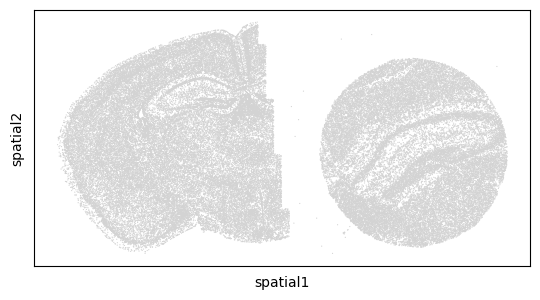

Store counts and library sizes for Poisson modeling...
Normalize data...


In [5]:
adata_st_list, adata_full = INSPIRE.utils.preprocess(adata_st_list=adata_st_list,
                                                     num_hvgs=1000,
                                                     min_genes_qc=6,
                                                     min_cells_qc=6,
                                                     spot_size=30,
                                                     limit_num_genes=True)

### Build spatial graph and prepare node features for LGCN

In [6]:
adata_st_list = INSPIRE.utils.build_graph_LGCN(adata_st_list=adata_st_list, 
                                               rad_cutoff_list=[100,100])

Start building graphs...
Build graphs and prepare node features for LGCN networks
Radius for graph connection is 100.0000.
59.4303 neighbors per cell on average.
Node features for slice 0 : (44950, 1872)
Radius for graph connection is 100.0000.
55.3459 neighbors per cell on average.
Node features for slice 1 : (29866, 1872)


### Run INSPIRE model

In [7]:
model = INSPIRE.model.Model_LGCN(adata_st_list=adata_st_list,
                                 n_spatial_factors=40,
                                 n_training_steps=20000,
                                 batch_size=2048,
                                 different_platforms=True
                                )

In [8]:
model.train(adata_st_list)

  0%|          | 3/20000 [00:00<45:40,  7.30it/s]  

Step: 0, d_loss: 1.3804, Loss: 1107.8776, recon_loss: 364.2183, fe_loss: 33.9514, geom_loss: 152.0855, beta_loss: 706.0208, gan_loss: 0.6454


  3%|▎         | 503/20000 [00:40<26:01, 12.48it/s]

Step: 500, d_loss: 0.4739, Loss: 1062.8374, recon_loss: 327.0807, fe_loss: 26.8601, geom_loss: 212.4773, beta_loss: 701.3384, gan_loss: 3.3085


  5%|▌         | 1003/20000 [01:20<25:18, 12.51it/s]

Step: 1000, d_loss: 0.3885, Loss: 1034.2128, recon_loss: 297.9872, fe_loss: 26.2441, geom_loss: 226.5229, beta_loss: 701.4506, gan_loss: 4.0004


  8%|▊         | 1503/20000 [02:00<24:51, 12.40it/s]

Step: 1500, d_loss: 0.4212, Loss: 1013.1816, recon_loss: 277.0578, fe_loss: 26.0369, geom_loss: 208.2087, beta_loss: 701.9286, gan_loss: 3.9940


 10%|█         | 2003/20000 [02:40<24:04, 12.46it/s]

Step: 2000, d_loss: 0.4306, Loss: 991.0729, recon_loss: 255.2527, fe_loss: 25.7833, geom_loss: 214.4679, beta_loss: 701.8830, gan_loss: 3.8646


 13%|█▎        | 2503/20000 [03:20<23:29, 12.41it/s]

Step: 2500, d_loss: 0.5530, Loss: 977.2664, recon_loss: 241.8146, fe_loss: 25.6681, geom_loss: 198.2184, beta_loss: 701.9707, gan_loss: 3.8487


 15%|█▌        | 3003/20000 [04:00<22:36, 12.53it/s]

Step: 3000, d_loss: 0.4567, Loss: 959.5751, recon_loss: 225.1785, fe_loss: 25.2786, geom_loss: 188.4720, beta_loss: 701.9492, gan_loss: 3.3995


 18%|█▊        | 3503/20000 [04:39<21:52, 12.57it/s]

Step: 3500, d_loss: 0.4580, Loss: 953.8770, recon_loss: 219.9923, fe_loss: 25.2972, geom_loss: 177.6109, beta_loss: 701.8467, gan_loss: 3.1885


 20%|██        | 4003/20000 [05:19<21:22, 12.47it/s]

Step: 4000, d_loss: 0.4336, Loss: 944.5686, recon_loss: 210.9358, fe_loss: 25.2467, geom_loss: 172.2353, beta_loss: 701.8006, gan_loss: 3.1408


 23%|██▎       | 4503/20000 [05:59<20:34, 12.56it/s]

Step: 4500, d_loss: 0.4527, Loss: 937.1896, recon_loss: 203.9106, fe_loss: 25.0024, geom_loss: 167.1406, beta_loss: 702.0719, gan_loss: 2.8620


 25%|██▌       | 5003/20000 [06:39<20:08, 12.41it/s]

Step: 5000, d_loss: 0.4972, Loss: 937.3575, recon_loss: 204.3245, fe_loss: 25.0842, geom_loss: 162.6318, beta_loss: 701.7872, gan_loss: 2.9091


 28%|██▊       | 5503/20000 [07:19<19:26, 12.43it/s]

Step: 5500, d_loss: 0.5321, Loss: 934.3118, recon_loss: 201.5955, fe_loss: 24.8613, geom_loss: 158.4373, beta_loss: 701.6425, gan_loss: 3.0438


 30%|███       | 6003/20000 [07:59<18:41, 12.48it/s]

Step: 6000, d_loss: 0.4736, Loss: 927.1862, recon_loss: 195.0019, fe_loss: 24.7317, geom_loss: 154.3978, beta_loss: 701.5516, gan_loss: 2.8130


 33%|███▎      | 6503/20000 [08:39<17:57, 12.52it/s]

Step: 6500, d_loss: 0.4030, Loss: 931.9471, recon_loss: 198.3225, fe_loss: 25.3106, geom_loss: 167.3774, beta_loss: 701.6801, gan_loss: 3.2864


 35%|███▌      | 7003/20000 [09:19<17:16, 12.54it/s]

Step: 7000, d_loss: 0.2965, Loss: 932.3434, recon_loss: 197.4599, fe_loss: 25.2167, geom_loss: 182.9161, beta_loss: 701.7018, gan_loss: 4.3067


 38%|███▊      | 7503/20000 [09:58<16:35, 12.56it/s]

Step: 7500, d_loss: 0.2778, Loss: 927.1822, recon_loss: 192.9050, fe_loss: 25.0668, geom_loss: 177.7019, beta_loss: 701.5798, gan_loss: 4.0767


 40%|████      | 8003/20000 [10:38<16:04, 12.44it/s]

Step: 8000, d_loss: 0.2667, Loss: 925.1646, recon_loss: 190.6947, fe_loss: 25.0511, geom_loss: 174.0815, beta_loss: 701.7958, gan_loss: 4.1413


 43%|████▎     | 8503/20000 [11:18<15:22, 12.47it/s]

Step: 8500, d_loss: 0.3204, Loss: 927.0892, recon_loss: 192.6733, fe_loss: 24.9504, geom_loss: 183.8102, beta_loss: 701.7314, gan_loss: 4.0579


 45%|████▌     | 9003/20000 [11:58<14:40, 12.49it/s]

Step: 9000, d_loss: 0.5917, Loss: 924.4792, recon_loss: 190.6605, fe_loss: 24.9616, geom_loss: 194.0464, beta_loss: 701.6375, gan_loss: 3.3386


 48%|████▊     | 9503/20000 [12:38<14:04, 12.43it/s]

Step: 9500, d_loss: 0.4401, Loss: 919.8731, recon_loss: 185.7394, fe_loss: 24.8804, geom_loss: 197.0424, beta_loss: 701.9235, gan_loss: 3.3890


 50%|█████     | 10003/20000 [13:18<13:21, 12.47it/s]

Step: 10000, d_loss: 0.4786, Loss: 924.5259, recon_loss: 189.7460, fe_loss: 25.0542, geom_loss: 202.3312, beta_loss: 701.6459, gan_loss: 4.0332


 53%|█████▎    | 10503/20000 [13:58<12:35, 12.57it/s]

Step: 10500, d_loss: 1.0833, Loss: 925.1063, recon_loss: 190.3775, fe_loss: 24.9870, geom_loss: 195.0566, beta_loss: 701.4221, gan_loss: 4.4186


 55%|█████▌    | 11003/20000 [14:37<11:51, 12.64it/s]

Step: 11000, d_loss: 0.6127, Loss: 925.0593, recon_loss: 191.4999, fe_loss: 25.1023, geom_loss: 175.7487, beta_loss: 701.7168, gan_loss: 3.2253


 58%|█████▊    | 11503/20000 [15:17<11:24, 12.41it/s]

Step: 11500, d_loss: 0.5606, Loss: 920.9508, recon_loss: 186.8466, fe_loss: 25.0311, geom_loss: 181.0251, beta_loss: 701.9043, gan_loss: 3.5483


 60%|██████    | 12003/20000 [15:57<10:37, 12.54it/s]

Step: 12000, d_loss: 0.5772, Loss: 919.0579, recon_loss: 186.0927, fe_loss: 25.0327, geom_loss: 171.7448, beta_loss: 701.7373, gan_loss: 2.7602


 63%|██████▎   | 12503/20000 [16:37<09:57, 12.55it/s]

Step: 12500, d_loss: 0.5493, Loss: 922.0925, recon_loss: 188.3122, fe_loss: 25.1438, geom_loss: 172.0260, beta_loss: 701.8330, gan_loss: 3.3629


 65%|██████▌   | 13003/20000 [17:17<09:19, 12.51it/s]

Step: 13000, d_loss: 0.5241, Loss: 917.9173, recon_loss: 184.3802, fe_loss: 24.8213, geom_loss: 204.9407, beta_loss: 701.5182, gan_loss: 3.0988


 68%|██████▊   | 13503/20000 [17:57<08:47, 12.33it/s]

Step: 13500, d_loss: 0.6190, Loss: 917.5731, recon_loss: 184.0115, fe_loss: 24.8391, geom_loss: 199.5222, beta_loss: 701.6268, gan_loss: 3.1053


 70%|███████   | 14003/20000 [18:37<08:05, 12.36it/s]

Step: 14000, d_loss: 0.5522, Loss: 920.2089, recon_loss: 186.5747, fe_loss: 25.0187, geom_loss: 182.4173, beta_loss: 701.6837, gan_loss: 3.2834


 73%|███████▎  | 14503/20000 [19:17<07:18, 12.55it/s]

Step: 14500, d_loss: 0.5803, Loss: 917.8388, recon_loss: 184.8993, fe_loss: 24.7555, geom_loss: 176.9848, beta_loss: 701.6060, gan_loss: 3.0384


 75%|███████▌  | 15003/20000 [19:57<06:38, 12.53it/s]

Step: 15000, d_loss: 0.5058, Loss: 918.8309, recon_loss: 185.4706, fe_loss: 24.9070, geom_loss: 170.9167, beta_loss: 701.6613, gan_loss: 3.3737


 78%|███████▊  | 15503/20000 [20:36<06:03, 12.38it/s]

Step: 15500, d_loss: 0.5948, Loss: 916.8358, recon_loss: 183.5508, fe_loss: 24.8522, geom_loss: 160.7567, beta_loss: 701.7112, gan_loss: 3.5064


 80%|████████  | 16003/20000 [21:16<05:20, 12.48it/s]

Step: 16000, d_loss: 0.5975, Loss: 914.3005, recon_loss: 181.9464, fe_loss: 24.7472, geom_loss: 172.2131, beta_loss: 701.3987, gan_loss: 2.7639


 83%|████████▎ | 16503/20000 [21:56<04:41, 12.43it/s]

Step: 16500, d_loss: 0.6016, Loss: 915.2278, recon_loss: 182.7234, fe_loss: 24.7153, geom_loss: 164.6563, beta_loss: 701.5428, gan_loss: 2.9531


 85%|████████▌ | 17003/20000 [22:36<03:58, 12.58it/s]

Step: 17000, d_loss: 0.5983, Loss: 912.9772, recon_loss: 181.2617, fe_loss: 24.7501, geom_loss: 154.2357, beta_loss: 701.4165, gan_loss: 2.4642


 88%|████████▊ | 17503/20000 [23:16<03:20, 12.48it/s]

Step: 17500, d_loss: 0.5978, Loss: 916.6935, recon_loss: 184.0978, fe_loss: 24.8059, geom_loss: 153.6965, beta_loss: 701.6282, gan_loss: 3.0878


 90%|█████████ | 18003/20000 [23:56<02:41, 12.35it/s]

Step: 18000, d_loss: 0.5956, Loss: 915.1566, recon_loss: 182.7483, fe_loss: 24.7924, geom_loss: 144.8719, beta_loss: 701.5306, gan_loss: 3.1877


 93%|█████████▎| 18503/20000 [24:36<01:59, 12.52it/s]

Step: 18500, d_loss: 0.6158, Loss: 912.2043, recon_loss: 180.8354, fe_loss: 24.7071, geom_loss: 152.1731, beta_loss: 701.4999, gan_loss: 2.1185


 95%|█████████▌| 19003/20000 [25:16<01:19, 12.54it/s]

Step: 19000, d_loss: 0.6072, Loss: 915.9505, recon_loss: 183.3734, fe_loss: 24.8276, geom_loss: 152.4524, beta_loss: 701.6520, gan_loss: 3.0484


 98%|█████████▊| 19503/20000 [25:56<00:39, 12.47it/s]

Step: 19500, d_loss: 0.5961, Loss: 914.7076, recon_loss: 182.7415, fe_loss: 24.6228, geom_loss: 145.4396, beta_loss: 701.5344, gan_loss: 2.9001


100%|██████████| 20000/20000 [26:35<00:00, 12.53it/s]


### Access spot representations, proportions of spatial factors in spots, and gene loading matrix

In [9]:
adata_full, basis_df = model.eval(adata_st_list, adata_full)
basis = np.array(basis_df.values)

Add cell/spot proportions of spatial factors into adata_full.obs...
Add cell/spot latent representations into adata_full.obsm['latent']...


Gene loading matrix is saved as basis.

### Spatial distributions of spatial factors in tissues

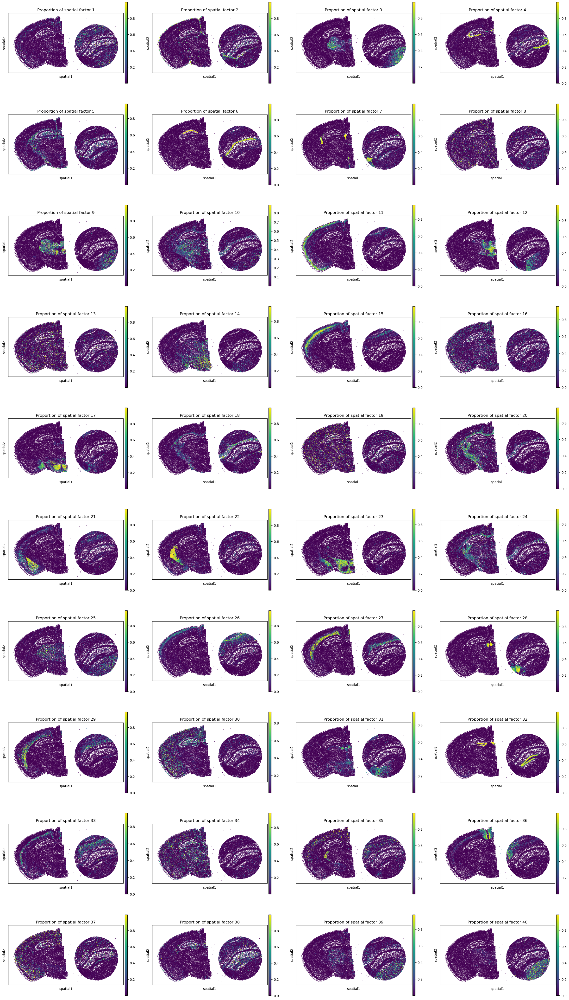

In [10]:
sc.pl.spatial(adata_full, color=["Proportion of spatial factor "+str(i+1) for i in range(40)], spot_size=40.)

### Spot representations and spatial domain identification

In [11]:
reducer = umap.UMAP(n_neighbors=30,
                    n_components=2,
                    metric="correlation",
                    n_epochs=None,
                    learning_rate=1.0,
                    min_dist=0.3,
                    spread=1.0,
                    set_op_mix_ratio=1.0,
                    local_connectivity=1,
                    repulsion_strength=1,
                    negative_sample_rate=5,
                    a=None,
                    b=None,
                    random_state=1234,
                    metric_kwds=None,
                    angular_rp_forest=False,
                    verbose=True)
embedding = reducer.fit_transform(adata_full.obsm['latent'])
adata_full.obsm["X_umap"] = embedding
adata_full.obs["slice"] = adata_full.obs["slice"].values.astype(str)

UMAP(angular_rp_forest=True, local_connectivity=1, metric='correlation', min_dist=0.3, n_neighbors=30, random_state=1234, repulsion_strength=1, verbose=True)
Fri Aug 23 14:07:21 2024 Construct fuzzy simplicial set
Fri Aug 23 14:07:21 2024 Finding Nearest Neighbors
Fri Aug 23 14:07:21 2024 Building RP forest with 19 trees
Fri Aug 23 14:07:23 2024 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	Stopping threshold met -- exiting after 3 iterations
Fri Aug 23 14:07:35 2024 Finished Nearest Neighbor Search
Fri Aug 23 14:07:38 2024 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Fri Aug 23 14:09:00 2024 Finished embedding


In [12]:
# perform spatial domain identification task by clustering on cell representations.
sc.pp.neighbors(adata_full, use_rep="latent")
sc.tl.louvain(adata_full, resolution=1.2)

Visualization of cell representations

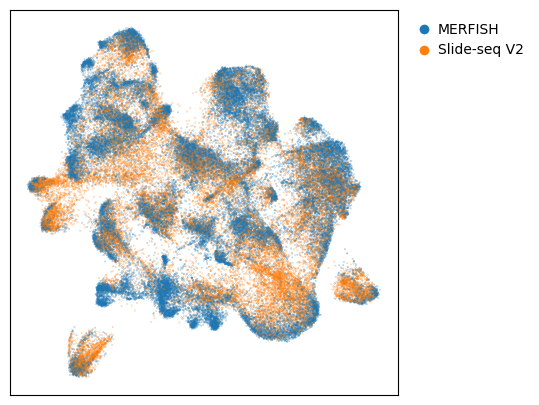

In [13]:
adata = adata_full

size = 0.02
umap = adata.obsm["X_umap"]
n_cells = umap.shape[0]
np.random.seed(1234)
order = np.arange(n_cells)
np.random.shuffle(order)

adata.obs["slice_color"] = ""
adata.obs["slice_color"][adata.obs["slice"].values.astype(str) == str(0)] = "tab:blue"
adata.obs["slice_color"][adata.obs["slice"].values.astype(str) == str(1)] = "tab:orange"

f = plt.figure(figsize=(5,5))

ax3 = f.add_subplot(1,1,1)
scatter2 = ax3.scatter(umap[order, 0], umap[order, 1], s=size, c=adata.obs["slice_color"][order], rasterized=True, marker='o')
ax3.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)

legend_elements_slice = [Line2D([0], [0], marker='o', color="w", label='MERFISH', markerfacecolor="tab:blue", markersize=10),
                         Line2D([0], [0], marker='o', color="w", label='Slide-seq V2', markerfacecolor="tab:orange", markersize=10)]
ax3.legend(handles=legend_elements_slice, loc="upper left", bbox_to_anchor=(1, 1.), frameon=False, 
           markerscale=.8, fontsize=10, handletextpad=0., ncol=1)

f.subplots_adjust(hspace=0.02, wspace=0.1)
plt.show()

In [14]:
# setup colors

rgb_10 = [i for i in get_cmap('Set3').colors]
rgb_20 = [i for i in get_cmap('tab20').colors]
rgb_20b = [i for i in get_cmap('tab20b').colors]
rgb_dark2 = [i for i in get_cmap('Dark2').colors]
rgb_pst1 = [i for i in get_cmap('Pastel1').colors]
rgb_acc = [i for i in get_cmap('Accent').colors]
rgb2hex_10 = [mpl.colors.rgb2hex(color) for color in rgb_10]
rgb2hex_20 = [mpl.colors.rgb2hex(color) for color in rgb_20]
rgb2hex_20b = [mpl.colors.rgb2hex(color) for color in rgb_20b]
rgb2hex_20b_new = [rgb2hex_20b[i] for i in [0, 3, 4, 7, 8, 11, 12, 15, 16, 19]]
rgb2hex_dark2 = [mpl.colors.rgb2hex(color) for color in rgb_dark2]
rgb2hex_pst1 = [mpl.colors.rgb2hex(color) for color in rgb_pst1]
rgb2hex_acc = [mpl.colors.rgb2hex(color) for color in rgb_acc]
rgb2hex = rgb2hex_20 + rgb2hex_20b_new + rgb2hex_dark2 + rgb2hex_pst1 + rgb2hex_acc
colors = rgb2hex
adata.obs["louvain_color"] = ""
for i in range(len(set(adata.obs["louvain"].values.astype(str)))):
    adata.obs["louvain_color"][adata.obs["louvain"].values.astype(str) == str(i)] = colors[i]

adata.obs["louvain_color"][adata.obs["louvain"].values.astype(str) == str(8)] = "#619CFF"
adata.obs["louvain_color"][adata.obs["louvain"].values.astype(str) == str(14)] = "#00BA38"
adata.obs["louvain_color"][adata.obs["louvain"].values.astype(str) == str(15)] = "#F8766D"
adata.obs["louvain_color"][adata.obs["louvain"].values.astype(str) == str(2)] = rgb2hex[15]

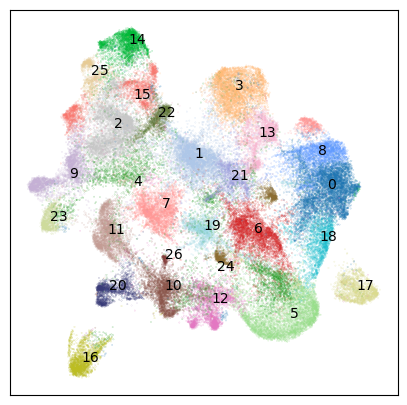

In [15]:
size = 0.01
umap = adata.obsm["X_umap"]
n_cells = umap.shape[0]
np.random.seed(1234)
order = np.arange(n_cells)
np.random.shuffle(order)

f = plt.figure(figsize=(5,5))

ax3 = f.add_subplot(1,1,1)
scatter2 = ax3.scatter(umap[order, 0], umap[order, 1], s=size, c=adata.obs["louvain_color"][order], rasterized=True, marker='o')
ax3.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)

for i in range(len(set(adata.obs["louvain"].values.astype(str)))):
    coor_tmp = umap[adata.obs["louvain"].values.astype(str) == str(i), :]
    coor_xy = np.median(coor_tmp, axis=0)
    if i == 24:
        coor_xy[0] = 6.5
        coor_xy[1] = 5.5
        ax3.annotate(str(i), coor_xy)
    elif i == 4:
        coor_xy[0] = 2
        coor_xy[1] = 9.5
        ax3.annotate(str(i), coor_xy)
    else:
        ax3.annotate(str(i), coor_xy)

f.subplots_adjust(hspace=0.02, wspace=0.1)
plt.show()

Visualization of spatial domain identification result

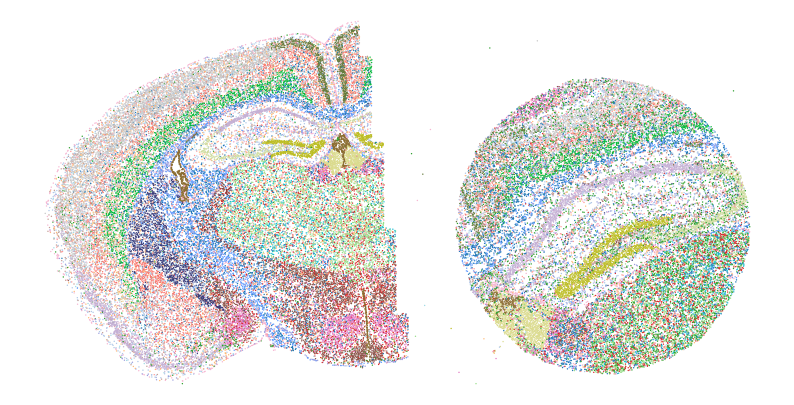

In [16]:
size = 1.
n_louvain = len(set(adata.obs["louvain"]))
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(1,1,1)
ax.axis('equal')
colors = rgb2hex
ax.scatter(adata.obsm["spatial"][:, 0], 
           -adata.obsm["spatial"][:, 1], 
           s=size, facecolors=adata.obs["louvain_color"], edgecolors='none', rasterized=True)
ax.set_axis_off()
f.subplots_adjust(hspace=0.02, wspace=0.1)
plt.show()